In [1]:
import pandas as pd
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

# 클래스 - encoding 변환 함수
def get_convert(class_dir='./open/classes.txt'):
    f = open(class_dir, 'r')
    lines = [list(line.strip().split(',')) for line in f.readlines()]
    f.close()

    encode = {}
    decode = {}
    for cls_num, cls_name in lines:
        encode[int(cls_num)] = cls_name
        decode[cls_name] = int(cls_num)
    
    return encode, decode

# 클래스 - 색상 변환
palette = [(220, 20, 60), (119, 11, 32), (0, 0, 142), (0, 0, 230), (106, 0, 228),
         (0, 60, 100), (0, 80, 100), (0, 0, 70), (0, 0, 192), (250, 170, 30),
         (100, 170, 30), (220, 220, 0), (175, 116, 175), (250, 0, 30), (165, 42, 42), 
         (255, 77, 255), (0, 226, 252), (182, 182, 255), (0, 82, 0), (120, 166, 157), 
         (110, 76, 0), (174, 57, 255), (199, 100, 0), (72, 0, 118), (255, 179, 240),
         (0, 125, 92), (209, 0, 151), (188, 208, 182), (0, 220, 176), (255, 99, 164),
         (92, 0, 73), (133, 129, 255), (78, 180, 255), (0, 228, 0)]

encode, decode = get_convert()

In [2]:
# csv 불러오기
base_dir = './results/0615.csv'


df = pd.read_csv(base_dir)

# 이미지별 bbox 정보 저장
results_dict = defaultdict(list)
for i in range(len(df)):
    info = dict(df.iloc[i])
    results_dict[info['file_name']].append(info)

df

,file_name,class_id,confidence,point1_x,point1_y,point2_x,point2_y,point3_x,point3_y,point4_x,point4_y
0,064442001.png,16,0.97571,1138,181,1429,181,1429,497,1138,497
1,064442001.png,11,0.10674,0,0,113,0,113,113,0,113
2,064507368.png,16,0.94408,492,124,761,124,761,431,492,431
3,064507368.png,22,0.12436,1053,0,1252,0,1252,186,1053,186
4,065131036.png,3,0.93695,1108,55,1359,55,1359,314,1108,314
...,...,...,...,...,...,...,...,...,...,...,...
9852,183928410.png,33,0.19227,1106,76,1363,76,1363,326,1106,326
9853,183928410.png,24,0.10226,1104,0,1366,0,1366,336,1104,336
9854,183928410.png,11,0.06607,0,0,97,0,97,83,0,83
9855,183928410.png,22,0.06012,934,0,1192,0,1192,108,934,108


In [3]:
def vis_multiple(image_idx=0, num=16, base_dir='./open/test', axis='on', valid=True):
    # image_names = sorted(list(results_dict.keys()))
    import glob
    image_names = [dir.split('/')[-1] for dir in sorted(glob.glob('./open/test/**.png'))]

    print(len(image_names))
    image_names = image_names[image_idx:image_idx+num]
    
    fig, axes = plt.subplots(num//2, 2, figsize=(20, 8*num//2))

    for i, image_name in enumerate(image_names):
        image_path = os.path.join(base_dir, image_name)

        ### 예측 시각화
        image = cv2.imread(image_path)
        title = f'{image_name}\n'
        # bbox 정보 불러오기
        anno_lines = results_dict[image_name]
        for idx, line in enumerate(anno_lines):
            cls = encode[line['class_id']]
            x1, y1 = line['point1_x'], line['point1_y']
            x2, y2 = line['point2_x'], line['point2_y']
            x3, y3 = line['point3_x'], line['point3_y']
            x4, y4 = line['point4_x'], line['point4_y']

            pts = np.array([[x1, y1], [x2, y2], [x3, y3], [x4, y4]], np.int32)

            # bbox 표시
            image = cv2.polylines(image, [pts], True, palette[line['class_id']], 3)
            
            # 클래스명 표시
            cv2.putText(
                image,
                text=f"{cls} {line['confidence']}",
                org=(pts[0][0]+2,pts[0][1]-5), 
                fontFace=cv2.FONT_HERSHEY_SIMPLEX, 
                fontScale=1,
                color=palette[line['class_id']], 
                thickness=2,
                lineType=cv2.LINE_AA,
            )
            title += f'{idx}: {cls} {line["confidence"]}\nsize={round((x3-x1)*(y3-y1),2)} ratio={round((y3-y1)/(x3-x1),2)}, {x1}_{y1}_{x3}_{y3}\n'
            

        axes[i//2][i%2].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axes[i//2][i%2].axis(axis)
        axes[i//2][i%2].set_title(title)



3400


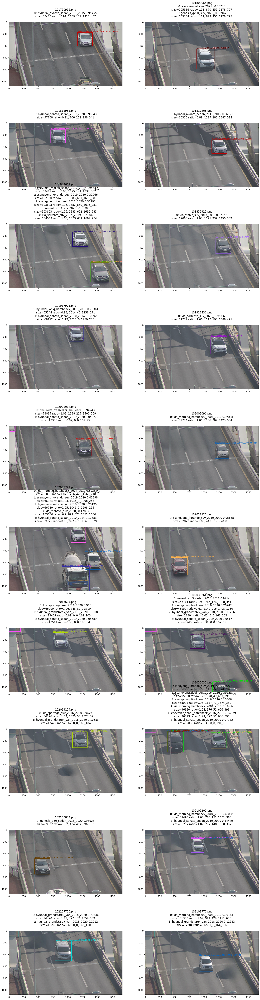

In [18]:
vis_multiple(image_idx=700, num=20, base_dir='./open/test', axis='on', valid=False)

In [ ]:
bad_images = [
    '065131036.png', # 트럭 -> morning, sorrentro
    '070305203.png', # kia sportage, kia morning, kia mohave 동시 예측
    '071126840.png', # 트럭 -> morning
    '071556611.png', # 트럭 -> morning
    '071711040.png', # 트럭 -> kia soul, kis sportage
    '072308411.png', # 트럭 -> kia ray, kia soul # 들어오고 나가는 트럭 예측
    '072624272.png', # 트럭 -> kia morning, kia ray, kia soul
    '072954236.png', # 트럭 -> kia morning, kia ray, kia stonic
    '073557960.png', # 트럭 -> kia morning # conf 높음
    '073952331.png', # 검은sub -> chev malibu, sonata, tivoli 예측
    '074120765.png', # 흰sub -> korando, tivoli
    '074141262.png', # 그림자진 트럭 -> kia morning, chev spark
    '074538938.png', # 파란버스윗부분 -> tivoli
    '074618306.png', # 작은흰트럭 -> kia soul, kia ray
    '074749994.png', # 좌상단검은트럭 -> morning conf 제일 높음, chev 클래스 헬갈려함*****
    '074830954.png', # chev -> 맞췄는데 morning으로도 예측
    '074910731.png', # 흰트럭 -> morning conf 두번째로 높음(0.93)
    '074915748.png', # 흰트럭 -> morning conf 두번쨰로 높음(0.9)
    '075135239.png', # 검은세단 -> avante, genesis, spark 헷갈려함
    '075203131.png', # 아이오닉택시 -> 헷갈려함
    '075545742.png', # 흰트럭 -> morning conf 매우 높음
]



good_images = [
    '065203472.png', # 트럭 -> 예측 안함

]

In [ ]:
image_names = [
    '073622129.png',
    
]